In [78]:
from dataretrieval import nwis
import pandas as pd
import folium
import statsmodels.api as sm
import numpy as np  
import seaborn as sns
import matplotlib.pyplot as plt
import os
import time
import re
from sklearn.cluster import DBSCAN
from pyproj import Proj, transform
from sklearn.decomposition import PCA
from sklearn.linear_model import Lasso,LinearRegression
from statsmodels.tsa.stattools import adfuller, kpss
import warnings
from statsmodels.tools.sm_exceptions import InterpolationWarning
from statsmodels.tsa.statespace.varmax import VARMAX
from statsmodels.tsa.statespace.tools import diff
from statsmodels.tsa.vector_ar.vecm import coint_johansen
from sklearn.model_selection import GridSearchCV,train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn import metrics
from timeit import default_timer as timer
from pmdarima import auto_arima
from pandas import Timestamp
from statsmodels.tsa.seasonal import seasonal_decompose
from dateutil.relativedelta import relativedelta

from io import BytesIO
from folium import IFrame
import base64
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense, LSTM
from statsmodels.tsa.arima.model import ARIMA
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV

# Predicting the Flow Rate (Discharge) of the Colorado River at Lee's Ferry Arizona

The colorado river is among the most important water supplies for western United States. Passing through 5 states, it supplies water via aqueducts and dams such as the Glen Canyon Dam, Hoover Dam, Davis Dam, Parker Dam, and Imperial Dam.

In this analysis we will use discharge data from the lower and upper Colorado Basin and precipitation data from the Upper basin to predict the discharge rate at the centerpoint of the river in Lee's Ferry Arizona.


![Colorado River](./data/Colorado_River_basin_map.png)

image source: 
By Shannon1 - Own work, CC BY-SA 4.0, https://commons.wikimedia.org/w/index.php?curid=65868008

# Gather Data

## Discharge

### Gather

In [281]:

# Upper Colorado River Basin

upper_df, md = nwis.get_info(huc='14')

# Lower Colorado River Basin

lower_df, md = nwis.get_info(huc='15')

In [282]:
upper_df = upper_df[upper_df['site_no'].str.len() <= 8] # Take only non-groundwater site information

lower_df = lower_df[lower_df['site_no'].str.len() <= 8]

df_sites = pd.concat([upper_df,lower_df],axis=0)

In [283]:
df_sites.to_csv('./data/sites_info.csv')

In [8]:
df_sites = pd.read_csv('./data/sites_info.csv',dtype={'site_no':str})

In [4]:

def collect(site_numbers, number_of_sites_in_query, parameter_code, stat_typeCD, dfs, problem_sites, start_date, end_date):

    chunks = [site_numbers[i:i + number_of_sites_in_query] for i in range(0, len(site_numbers), number_of_sites_in_query)]

    for chunk in chunks:
        try:
            df, md = nwis.get_dv(sites=chunk, parameterCd=parameter_code,  start=start_date,end=end_date,statCd=stat_typeCD,ssl_check=False)
            dfs.append(df)
        except Exception as e:
            print(f'Error processing chunk: {chunk}: {e}')

            if len(chunk) == 1:
                problem_sites.add((chunk[0], parameter_code, e))
            else:
                problem_sites.update([(c, parameter_code, e) for c in chunk])
                collect(chunk, number_of_sites_in_query - 1, parameter_code, stat_typeCD, dfs, problem_sites)

    return dfs, problem_sites

def build(site_numbers, number_of_sites_in_query, parameter_code, stat_typeCD,start_date,end_date):
    dfs = []
    problem_sites = set()

    

    dfs, problem_sites = collect(site_numbers, number_of_sites_in_query, parameter_code,stat_typeCD, dfs, problem_sites,start_date,end_date)

    

    df = pd.concat(dfs, axis=0)
    

    return df, problem_sites

In [5]:
warnings.filterwarnings("ignore")
startDate = "2002-01-01"
endDate = "2022-01-01"


df, problem_sites = build(list(df_sites['site_no']), 10, '00060','00003',startDate,endDate)

print(f'We cannot collect data for {len(problem_sites)} sites')
print(df)

In [77]:
df = df.reset_index().rename(columns={'index':'DATE'})

In [422]:
df.to_csv('./data/discharge_sites.csv')

In [9]:
df = pd.read_csv('./data/discharge_sites.csv',dtype={'site_no':str,'parameter_cd':str})


C:\Users\aaron\AppData\Local\Temp\ipykernel_18396\2450021471.py:1: DtypeWarning: Columns (6,8,10,12) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('./data/discharge_sites.csv',dtype={'site_no':str,'parameter_cd':str})


In [5]:
len(df[df['site_no'].isna()])

3397593

In [10]:
dis_df = df.loc[:,['DATE','00060_Mean','site_no']]

### Cleaning

In [25]:

def convert_entry(row):
    date_entry = row['DATE']
    site_no_entry = row['site_no']
    
    # Check if it's already a pandas Timestamp object (or some other type that's not a string)
    if not isinstance(date_entry, str):
        return row
    
    # Use Regular Expression to extract datetime string
    timestamp_match = re.search(r"Timestamp\('([^']*)'", date_entry)
    site_no_match = re.search(r"\('([^']*)'", date_entry)
    
    if timestamp_match:
        date_str = timestamp_match.group(1)
        date_dt = pd.to_datetime(date_str)
        row['DATE'] = date_dt
    
    # Extract site_no only if it's NaN
    if site_no_match and pd.isna(site_no_entry):
        site_no_str = site_no_match.group(1)
        row['site_no'] = site_no_str

    return row




# Apply the conversion function to each row of the DataFrame
dis_df = dis_df.apply(convert_entry, axis=1)

# Check the DataFrame
print(dis_df)

# Check the data types to verify that the 'DATE' column is now datetime64
print(dis_df.dtypes)



                              DATE  00060_Mean   site_no
0        2002-01-01 00:00:00+00:00        10.0  09010500
1        2002-01-02 00:00:00+00:00        10.0  09010500
2        2002-01-03 00:00:00+00:00        10.0  09010500
3        2002-01-04 00:00:00+00:00        10.0  09010500
4        2002-01-05 00:00:00+00:00        10.0  09010500
...                            ...         ...       ...
3740748  2021-12-28 00:00:00+00:00         0.0  09537500
3740749  2021-12-29 00:00:00+00:00         0.0  09537500
3740750  2021-12-30 00:00:00+00:00         0.0  09537500
3740751  2021-12-31 00:00:00+00:00         0.0  09537500
3740752  2022-01-01 00:00:00+00:00         0.0  09537500

[3740753 rows x 3 columns]
DATE           object
00060_Mean    float64
site_no        object
dtype: object


In [26]:

dis_df.to_csv('./data/discharge_sites_clean.csv')

In [11]:
dis_df = pd.read_csv('./data/discharge_sites_clean.csv',dtype={'site_no':str})

In [12]:
dis_df['DATE'] = pd.to_datetime(dis_df['DATE']).dt.tz_localize(None)

In [13]:
dis_df = dis_df.drop(columns='Unnamed: 0')


In [14]:
dis_df_pivot = dis_df.pivot(index='DATE',columns='site_no',values='00060_Mean')


print(dis_df_pivot.dropna(axis=1).shape)

print('Number of stations total',dis_df_pivot.shape[1])


print('Number of stations with complete data', dis_df_pivot.dropna(axis=1).shape[1])

print('Number of stations with data', dis_df_pivot.dropna(axis=1,how='all').shape[1])



(7306, 300)
Number of stations total 749
Number of stations with complete data 300
Number of stations with data 746


C:\Users\aaron\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\aaron\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\aaron\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operati

<AxesSubplot: >

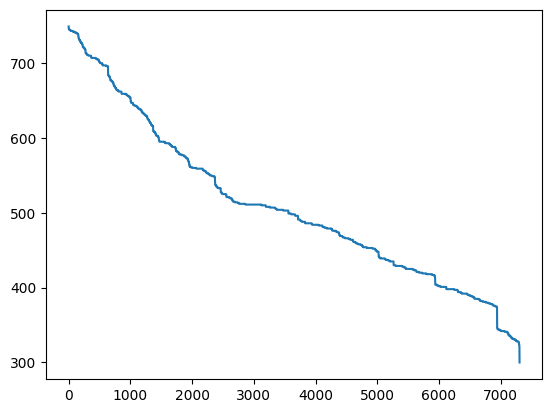

In [9]:
# Visualize to find optimal threshold to drop null values

Number_of_sites_y = []
Threshold_x = range(7307)

for threshold in Threshold_x:
    Number_of_sites_y.append(dis_df_pivot.dropna(axis=1,thresh=threshold).shape[1])

sns.lineplot(x=Threshold_x,y=Number_of_sites_y)

We would have to add hundreds of datapoints to save some of these sites. It is not worth corrupting our data when we still have 300 sites.

In [15]:
dis_df_pivot.dropna(axis=1,inplace=True)

### Mapping

In [16]:
# Map the sites to visualize and ensure relevance of the site

dis_sites = df_sites.loc[df_sites['site_no'].isin(set(dis_df_pivot.columns))].copy()


In [17]:
colorado_river_sites = []

for name,number in zip(df_sites['station_nm'],df_sites['site_no']):
    if 'colorado river' in name.lower():
        colorado_river_sites.append((name,number))

print(colorado_river_sites)

dis_sites['co_river'] = dis_sites['site_no'].isin(number[1] for number in colorado_river_sites)

[('COLORADO RIVER BLW LULU CITY SITE NR GRAND LAKE CO', '09010160'), ('COLORADO RIVER BELOW BAKER GULCH NR GRAND LAKE, CO', '09010500'), ('COLORADO RIVER NEAR GRAND LAKE, CO.', '09011000'), ('COLORADO RIVER BL SHADOW MOUNTAIN RESERVOIR, CO.', '09015000'), ('COLORADO RIVER BELOW LAKE GRANBY, CO.', '09019000'), ('COLORADO RIVER NEAR GRANBY, CO', '09019500'), ('COLORADO RIVER AT WINDY GAP, NEAR GRANBY, CO.', '09034250'), ('COLORADO RIVER AT HOT SULPHUR SPRINGS, CO.', '09034500'), ('COLORADO RIVER BELOW CORRAL CREEK NEAR PARSHALL,CO', '09038750'), ('COLORADO RIVER NEAR KREMMLING, CO', '09058000'), ('COLORADO RIVER NEAR RADIUM, CO.', '09058030'), ('COLORADO RIVER AT CATAMOUNT BRIDGE, CO', '09060799'), ('COLORADO RIVER NEAR DOTSERO, CO', '09070500'), ('COLORADO RIVER NEAR GLENWOOD SPRINGS, CO.', '09071100'), ('COLORADO RIVER ABOVE GLENWOOD SPRINGS, CO', '09071750'), ('COLORADO RIVER AT GLENWOOD SPRINGS, CO.', '09072500'), ('COLORADO RIVER BELOW GLENWOOD SPRINGS, CO', '09085100'), ('COLORADO 

In [61]:
# Build column for coordinates

dis_sites['coordinates'] = [[lat, lon] for lat, lon in zip(dis_sites['dec_lat_va'], dis_sites['dec_long_va'])]

# Initialize map on Colorado River at Lees Ferry, AZ site_no: 09380000

dis_map = folium.Map(location=dis_sites[dis_sites['site_no'] == '09380000']['coordinates'].iloc[0], zoom_start=6)

# Loop through locations and add each to the map.
for location in dis_sites.index:
    folium.Marker(
        location=dis_sites.loc[location,'coordinates'],
        tooltip=dis_sites.loc[location,'site_no'],
        popup=dis_sites.loc[location,'station_nm'],
        icon = folium.Icon(color=('green' if dis_sites.loc[location, 'site_no']== '09380000' else  'red' if dis_sites.loc[location,'co_river']==True  else 'darkblue' ))
    ).add_to(dis_map)

dis_map.save('../Final_Project/maps/discharge_sites_map.html')

dis_map

## Precipitation



### Gather

Monthly precipitation data can be found at this website:

https://www.ncei.noaa.gov/access/search/data-search/global-summary-of-the-month?pageNum=1

By selecting the type of data required, dates of interest, and coordinates of the locations. The data can be sent directly to an email address.

From the watershed boundary dataset found on the USGS website, the coordinates for the upper colorado basin (HUC14) are:

 
    HUC14 = 43.452,-112.329,35.558,-105.624 (North, West, South, East)
            
    Northwest Quadrant: (43.452, -112.329, 39.505, -108.9765)
    Northeast Quadrant: (43.452, -108.9765, 39.505, -105.624)
    Southwest Quadrant: (39.505, -112.329, 35.558, -108.9765)
    Southeast Quadrant: (39.505, -108.9765, 35.558, -105.624)
    
We only want the upper colorado basin in this case as precipitation in the lower basin will not correlate with discharge of the river at Lee's ferry (a middle point)

Global summary of the month data citation:

Lawrimore, Jay H.; Ray, Ron; Applequist, Scott; Korzeniewski, Bryant; Menne, Matthew J. (2016): Global Summary of the Month (GSOM), Version 1.0.3 [indicate subset used]. NOAA National Centers for Environmental Information. https://doi.org/10.7289/V5QV3JJ5. [access date].

In [14]:
prec_df = pd.DataFrame()

for filename in os.listdir('./data/precipitation_csvs/'):
    prec_df_1 = pd.read_csv(f'./data/precipitation_csvs/{filename}')

    prec_df = pd.concat([prec_df,prec_df_1])
                            

In [48]:
prec_df.to_csv('./data/precipitation_data.csv')

In [18]:
prec_df= pd.read_csv('./data/precipitation_data.csv')

### Cleaning

In [19]:
print(prec_df.dtypes)

print("Missing values:", prec_df.isnull().sum())

Unnamed: 0           int64
STATION             object
NAME                object
LATITUDE           float64
LONGITUDE          float64
ELEVATION          float64
DATE                object
PRCP               float64
PRCP_ATTRIBUTES     object
dtype: object
Missing values: Unnamed: 0         0
STATION            0
NAME               0
LATITUDE           0
LONGITUDE          0
ELEVATION          0
DATE               0
PRCP               0
PRCP_ATTRIBUTES    0
dtype: int64


In [20]:
prec_df['DATE'] = pd.to_datetime(prec_df['DATE'])

print(prec_df.shape , 'before dropping nulls')

prec_df = prec_df.dropna()

print(prec_df.shape , 'after dropping nulls')

# Drop duplicates 
prec_df = prec_df.drop_duplicates(subset=['STATION', 'DATE', 'PRCP'])

print(prec_df.shape , 'after dropping duplicates')

(5359360, 9) before dropping nulls
(5359360, 9) after dropping nulls
(5359360, 9) after dropping duplicates


In [21]:
prec_df_pivot = prec_df.pivot(columns='STATION', index='DATE',values='PRCP')

print('Number of stations total',prec_df_pivot.shape[1])

print('Number of stations with complete data', prec_df_pivot.dropna(axis=1).shape[1])

print('Number of stations with partial data', prec_df_pivot.dropna(axis=1,thresh=7000).shape[1])


Number of stations total 1625
Number of stations with complete data 140
Number of stations with partial data 377


C:\Users\aaron\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\aaron\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\aaron\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operati

<AxesSubplot: >

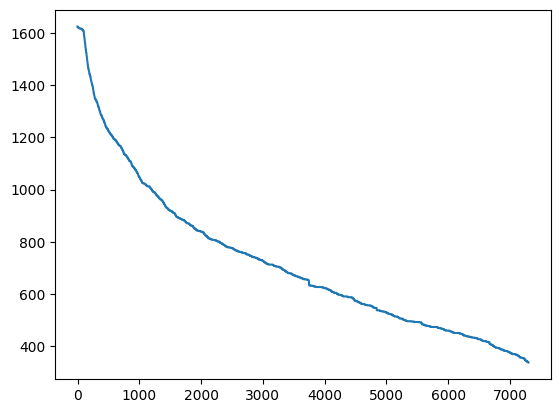

In [52]:
# Visualize to find optimal threshold to drop null values

Number_of_sites_y = []
Threshold_x = range(7301)

for threshold in Threshold_x:
    Number_of_sites_y.append(prec_df_pivot.dropna(axis=1,thresh=threshold).shape[1])

sns.lineplot(x=Threshold_x,y=Number_of_sites_y)


Again, we would have to add hundreds of datapoints to save some of these stations. It is not worth corrupting our data when we still have ~400 stations.

In [22]:
prec_df_pivot.dropna(axis=1,inplace=True)

### Mapping

In [89]:
prec_df = prec_df.loc[prec_df['STATION'].isin(prec_df_pivot.columns.tolist())]

prec_info_df = prec_df.drop_duplicates(subset=['STATION', 'LATITUDE', 'LONGITUDE']).copy()

prec_info_df.reset_index(inplace=True,drop=True)

# Build column for coordinates

prec_info_df['COORDINATES'] = [[lat, lon] for lat, lon in zip(prec_info_df['LATITUDE'], prec_info_df['LONGITUDE'])]


# Initialize map on Colorado River at Lees Ferry, AZ site_no: 09380000

prec_map = folium.Map(location=dis_sites[dis_sites['site_no'] == '09380000']['coordinates'].iloc[0], zoom_start=6)

# Loop through locations and add each to the map.
for location in prec_info_df.index:
    folium.Marker(
        location=prec_info_df.loc[location,'COORDINATES'],
        tooltip=prec_info_df.loc[location,'STATION'],
        popup=prec_info_df.loc[location,'NAME'],
        icon = folium.Icon(color='blue')
    ).add_to(prec_map)
folium.Marker(location=dis_sites[dis_sites['site_no'] == '09380000']['coordinates'].iloc[0],
              tooltip=dis_sites[dis_sites['site_no'] == '09380000']['site_no'].iloc[0],
              popup=dis_sites[dis_sites['site_no'] == '09380000']['station_nm'].iloc[0],
              icon=folium.Icon(color='green')).add_to(prec_map)


prec_map.save('../Final_Project/maps/precipitation_sites.html')

prec_map

## Mapping and Visualizations

In [62]:
data_map = folium.Map(location=dis_sites[dis_sites['site_no'] == '09380000']['coordinates'].iloc[0], zoom_start=6)

# Loop through locations and add each to the map.
for location in prec_info_df.index:
    folium.Marker(
        location=prec_info_df.loc[location,'COORDINATES'],
        tooltip=prec_info_df.loc[location,'STATION'],
        popup=prec_info_df.loc[location,'NAME'],
        icon = folium.Icon(color=('blue'))
    ).add_to(data_map)

for location in dis_sites.index:
    folium.Marker(
        location=dis_sites.loc[location,'coordinates'],
        tooltip=dis_sites.loc[location,'site_no'],
        popup=dis_sites.loc[location,'station_nm'],
        icon = folium.Icon(color=('green' if dis_sites.loc[location, 'site_no']== '09380000' else  'red' if dis_sites.loc[location,'co_river']==True  else 'darkblue' ) )
    ).add_to(data_map)


data_map.save('../Final_Project/maps/data_sites_map.html')

data_map

In [84]:
graph_map = folium.Map(location=dis_sites[dis_sites['site_no'] == '09380000']['coordinates'].iloc[0], zoom_start=6)
global_min_dis = dis_df_pivot.min().min()
global_max_dis = dis_df_pivot.max().max()

for idx, row in dis_sites.iterrows():

    coordinates = row['coordinates']
    
    code = row['site_no']

    # Create the plot for this point
    plt.figure(figsize=(4.5,2.5))
    plt.plot(dis_df_pivot[code])
    plt.title(f"{code}:{row['station_nm']}")
    
    plt.ylim(global_min_dis, global_max_dis)

    # Save plot to a Bytes buffer
    buffer = BytesIO()
    plt.savefig(buffer, format='png')
    plt.close()
    
    # Encode the Bytes buffer to base64 image
    buffer.seek(0)
    base64_img = base64.b64encode(buffer.read()).decode()
    
    # Create an iframe with the base64 image embedded
    html = f'<img src="data:image/png;base64,{base64_img}">'
    iframe = IFrame(html, width=500, height=300)
    
    # Create the marker with the embedded plot as a popup
    folium.Marker(coordinates,
                tooltip=code,
                icon=folium.Icon(color=('green' if code== '09380000' else  'red' if row['co_river']==True  else 'darkblue' )),
                popup=folium.Popup(iframe)).add_to(graph_map)

global_min_prec = prec_df_pivot.min().min()
global_max_prec = prec_df_pivot.max().max()

for idx, row in prec_info_df.iterrows():

    coordinates = row['COORDINATES']
    
    code = row['STATION']

    # Create the plot for this point
    plt.figure(figsize=(4.5,2.5))
    plt.plot(prec_df_pivot[code])
    plt.title(f"{code}:{row['NAME']}")
    
    plt.ylim(global_min_prec, global_max_prec)

    # Save plot to a Bytes buffer
    buffer = BytesIO()
    plt.savefig(buffer, format='png')
    plt.close()
    
    # Encode the Bytes buffer to base64 image
    buffer.seek(0)
    base64_img = base64.b64encode(buffer.read()).decode()
    
    # Create an iframe with the base64 image embedded
    html = f'<img src="data:image/png;base64,{base64_img}">'
    iframe = IFrame(html, width=500, height=300)
    
    # Create the marker with the embedded plot as a popup
    folium.Marker(coordinates,
                tooltip=code,
                icon=folium.Icon(color='blue'),
                popup=folium.Popup(iframe)).add_to(graph_map)


graph_map


In [76]:
graph_map.save('../Final_Project/maps/graph_map.html')

# Build Models

Next we will build some basic models to predict discharge at Lee's ferry. The obvious problem however is that discharge rate of one river is obviously colinearly related to another. Therefore our data will have multicolinearity. 

## Diagnose and manage multicolinearity

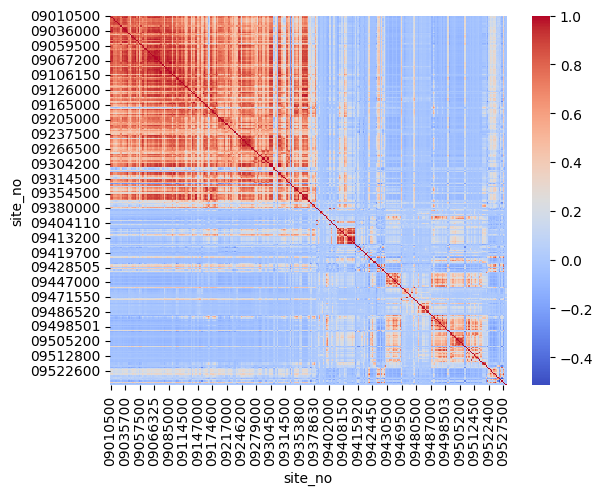

In [24]:
cor_matrix = dis_df_pivot.corr()

sns.heatmap(cor_matrix, annot=False, cmap='coolwarm')

plt.show()

#### Clustering Discharge sites together using DBSCANS

Since these sites' geographic location is likely related to how collinear they are with each other, it might be a good idea to cluster the sites and then take their mean. DBScans is the obvious choice for an algorithm as this is ideally suited for geographic locations.

C:\Users\aaron\AppData\Local\Temp\ipykernel_18396\2938026454.py:8: FutureWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  dis_sites['x'], dis_sites['y'] = transform(wgs84, utm, dis_sites['dec_long_va'].values, dis_sites['dec_lat_va'].values)


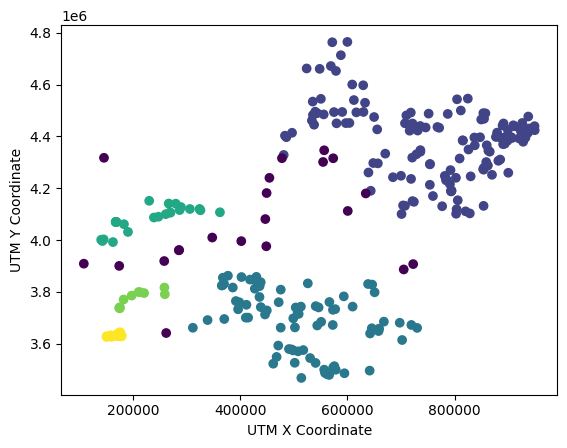

In [26]:
lees_ferry = dis_sites.loc[dis_sites['site_no']=='09380000'].copy()

dis_sites = dis_sites.drop(lees_ferry.index)

wgs84 = Proj(proj='latlong', datum='WGS84')
utm = Proj(proj='utm', zone=12, datum='WGS84')

dis_sites['x'], dis_sites['y'] = transform(wgs84, utm, dis_sites['dec_long_va'].values, dis_sites['dec_lat_va'].values)
coordinates_utm = dis_sites[['x','y']]


dbscan = DBSCAN(eps=75000, min_samples=5) # eps is the radius of neighborhood and min_samples is the minimum points required to form a cluster
dis_sites['ClusterID'] = dbscan.fit_predict(coordinates_utm)


cluster_map = {}

for cluster_id in dis_sites['ClusterID'].unique():
    
    cluster_mask = dis_sites['ClusterID'] == cluster_id
    cluster_pts = dis_sites[cluster_mask]['site_no'].values
    cluster_map[cluster_id]= cluster_pts


plt.scatter(dis_sites['x'], dis_sites['y'], c=dis_sites['ClusterID'])
plt.xlabel('UTM X Coordinate')
plt.ylabel('UTM Y Coordinate')
plt.show()

In [27]:
dis_df_pivot_cluster = pd.DataFrame()

for cluster_id in cluster_map.keys():

    df_of_sites_in_cluster= dis_df_pivot[list(cluster_map[cluster_id])].copy() # Data for each cluster

    if cluster_id == -1: # Do not take mean of outliers
        dis_df_pivot_cluster = pd.concat([dis_df_pivot_cluster,df_of_sites_in_cluster],axis=1)

    new_series = df_of_sites_in_cluster.mean(axis=1).rename(f'Cluster_{cluster_id}') # Take mean of clusters

    dis_df_pivot_cluster = pd.concat([dis_df_pivot_cluster,new_series],axis=1) # Add them to df

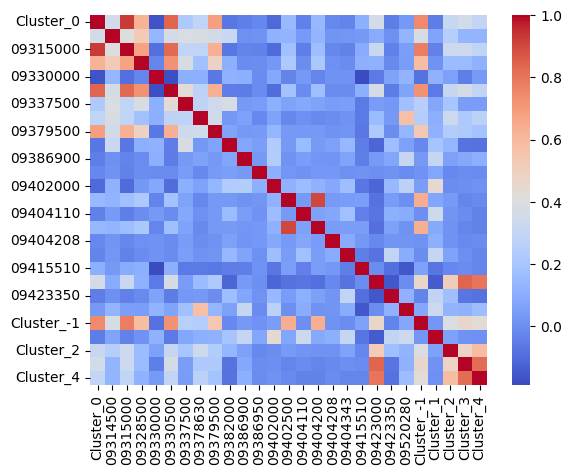

In [28]:

dis_cor_matrix = dis_df_pivot_cluster.corr()

sns.heatmap(dis_cor_matrix, annot=False, cmap='coolwarm')

plt.show()

In [29]:

dis_df_pivot_cluster = dis_df_pivot_cluster.loc[pd.to_datetime('2002-01-03'):]

prec_df_pivot = prec_df_pivot.loc[:'2022-01-01']

dis_df_pivot = dis_df_pivot.loc[pd.to_datetime('2002-01-03'):]

## OLS Models

In [159]:
DATA = pd.concat([prec_df_pivot,dis_df_pivot_cluster,dis_df_pivot['09380000']],axis=1) 

scaler = StandardScaler()

y= DATA['09380000']

X_OLS = scaler.fit_transform(DATA.drop('09380000',axis=1))


X_train, X_test, Y_train, Y_test = train_test_split(X_OLS, y, test_size=0.2, random_state=42)


ols_model  = sm.OLS(Y_train, sm.add_constant(X_train)).fit()

lasso_model = sm.OLS(Y_train, sm.add_constant(X_train)).fit_regularized(alpha = 0.01,L1_wt=1.0)# Go with Lasso regression because some of the coefficients should be set to zero and not just reduced

In [31]:
warnings.simplefilter(action='ignore', category=FutureWarning)

# OLS predictions and performance
ols_predictions = ols_model.predict(sm.add_constant(X_test))
ols_mse = mean_squared_error(Y_test, ols_predictions)
ols_rmse = np.sqrt(ols_mse)
ols_mae = mean_absolute_error(Y_test, ols_predictions)

# Lasso predictions and performance
lasso_predictions = lasso_model.predict(sm.add_constant(X_test))
lasso_mse = mean_squared_error(Y_test, lasso_predictions)
lasso_rmse = np.sqrt(lasso_mse)
lasso_mae = mean_absolute_error(Y_test, lasso_predictions)



# Print metrics
print("OLS R-squared:", ols_model.rsquared)
print("OLS MSE:", ols_mse)
print("OLS RMSE:", ols_rmse)
print("OLS MAE:", ols_mae)

print("Lasso MSE:", lasso_mse)
print("Lasso RMSE:", lasso_rmse)
print("Lasso MAE:", lasso_mae)

OLS R-squared: 0.8830131989490206
OLS MSE: 1456508.5729365963
OLS RMSE: 1206.858969779235
OLS MAE: 650.1409258016773
Lasso MSE: 1456555.2573948612
Lasso RMSE: 1206.8783109306676
Lasso MAE: 649.9427567145061


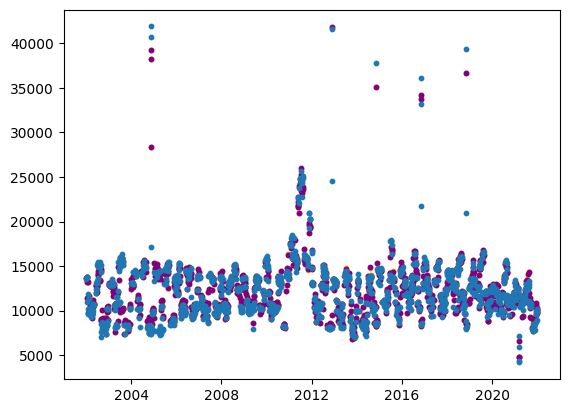

In [ ]:

fig, ax = plt.subplots()



ax.scatter(Y_test.index, lasso_predictions,color = 'purple',s=10)


ax.scatter(Y_test.index,Y_test,s=10)

In [ ]:
fig, ax = plt.subplots()

ax.scatter(Y_test.index, ols_predictions,color = 'orange',s=10)

ax.scatter(Y_test.index,Y_test,s=10)

## SARIMAX

For seasonal time-series data with several exogeneous variables, a SARIMAX model is the obvious choice.

In [160]:
# Check to see if the data can even be made to be stationary

def Stationarity_test(Series):
    
    adf_pval = adfuller(Series)[1]

    kpss_pval = kpss(Series)[1]

    if adf_pval < 0.05 and kpss_pval >= 0.05:
        
        
        return
    
    elif adf_pval >= 0.05 and kpss_pval < 0.05:

        return print(f"{Series.name} data has a unit root and is non-Stationary")

    elif adf_pval < 0.05 and kpss_pval <0.05:

        return print(f"{Series.name} data is difference stationary")

    elif adf_pval >= 0.05 and kpss_pval >= 0.05:

        return print(f"{Series.name} data is trend stationary")

SARIMA_DATA = DATA


In [29]:
with warnings.catch_warnings():
    warnings.filterwarnings("ignore", category=InterpolationWarning)
    diff(SARIMA_DATA,k_diff=1).apply(Stationarity_test)


USW00024089 data is difference stationary


In [161]:
# Train test split


SARIMA_DATA_train = SARIMA_DATA.loc[:pd.to_datetime('2020-01-01')]

SARIMA_DATA_test = SARIMA_DATA.loc[pd.to_datetime('2020-01-01'):]


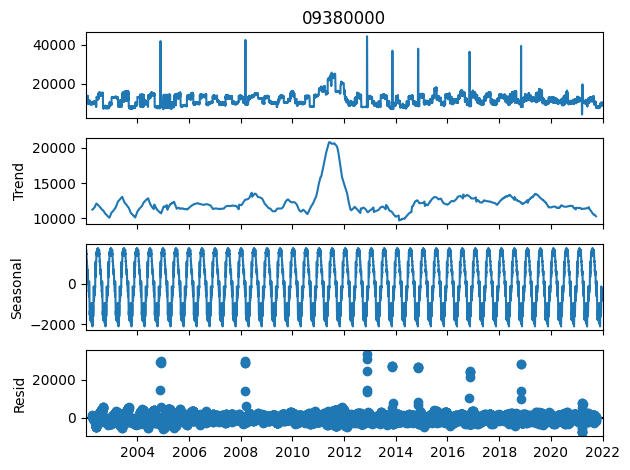

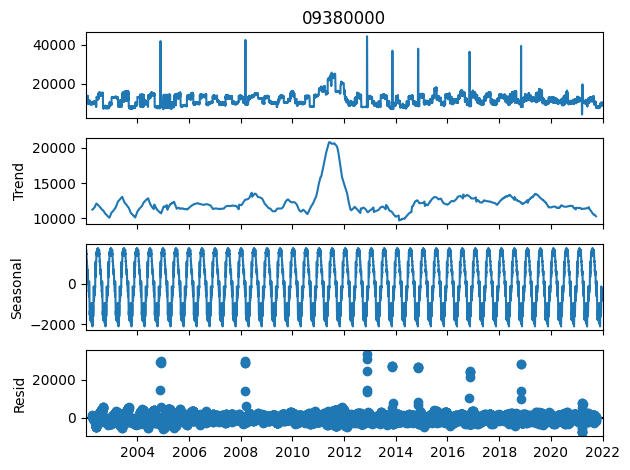

In [35]:
# Find seasonal period

seasonal_decompose(SARIMA_DATA['09380000'],period=184).plot() # Roughly half a year

In [73]:
# Build ARIMA model 

warnings.simplefilter(action='ignore', category=FutureWarning)

model_params = auto_arima(SARIMA_DATA['09380000'],
                        start_p=1, start_q=1, start_P=1, start_Q=1,
                        max_p=3, max_q=3, max_P=3, max_Q=3,
                        m=2,  # Number of periods in each season
                        seasonal=True,
                        d=1, D=1,
                        trace=True,
                        error_action='ignore',
                        suppress_warnings=True,
                        stepwise=True).get_params()

s_order = model_params.get('seasonal_order', 'Not found')
model_order=model_params['order']

sarimax_model = sm.tsa.SARIMAX(SARIMA_DATA_train['09380000'],exog = SARIMA_DATA_train.drop('09380000',axis=1),order=model_order,seasonal_order=s_order)
sarimax_result = sarimax_model.fit(maxiter=1000)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(1,1,1)[2]             : AIC=inf, Time=8.97 sec
 ARIMA(0,1,0)(0,1,0)[2]             : AIC=132462.941, Time=0.12 sec
 ARIMA(1,1,0)(1,1,0)[2]             : AIC=130370.061, Time=2.05 sec
 ARIMA(0,1,1)(0,1,1)[2]             : AIC=inf, Time=2.20 sec
 ARIMA(1,1,0)(0,1,0)[2]             : AIC=132341.956, Time=0.24 sec
 ARIMA(1,1,0)(2,1,0)[2]             : AIC=129287.684, Time=2.95 sec
 ARIMA(1,1,0)(3,1,0)[2]             : AIC=128680.622, Time=4.12 sec
 ARIMA(1,1,0)(3,1,1)[2]             : AIC=inf, Time=11.00 sec
 ARIMA(1,1,0)(2,1,1)[2]             : AIC=inf, Time=4.84 sec
 ARIMA(0,1,0)(3,1,0)[2]             : AIC=128746.507, Time=0.74 sec
 ARIMA(1,1,1)(3,1,0)[2]             : AIC=inf, Time=8.00 sec
 ARIMA(0,1,1)(3,1,0)[2]             : AIC=128666.311, Time=3.94 sec
 ARIMA(0,1,1)(2,1,0)[2]             : AIC=129241.754, Time=3.04 sec
 ARIMA(0,1,1)(3,1,1)[2]             : AIC=inf, Time=8.77 sec
 ARIMA(0,1,1)(2,1,1)[2]             : AIC=inf,

c:\Users\aaron\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\Users\aaron\anaconda3\envs\tf\lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\Users\aaron\anaconda3\envs\tf\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [74]:
# Predict on training data


start= SARIMA_DATA_train.index[-1]
end=  SARIMA_DATA.index[-1] - relativedelta(days=1)

SARIMAX_predictions = sarimax_result.predict(start,end,typ='levels',exog=SARIMA_DATA_test.drop('09380000',axis=1).loc[start:end - relativedelta(days=1)])



<Axes: >

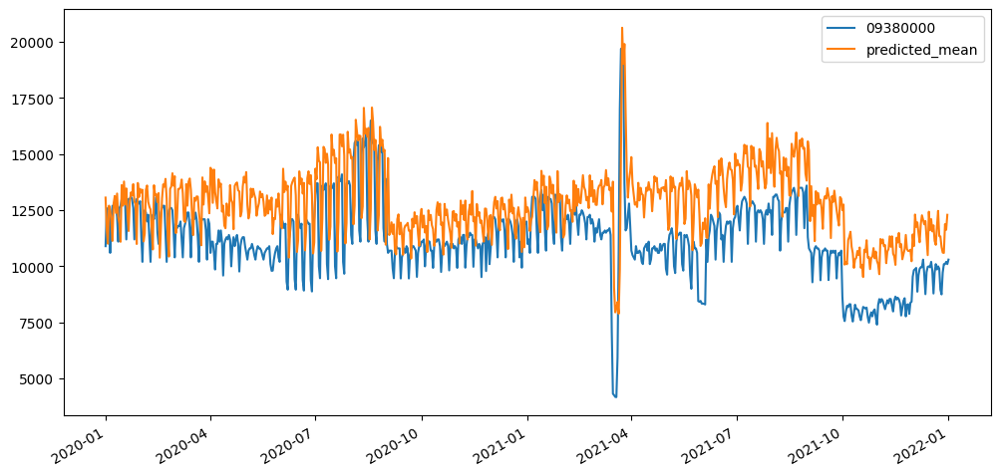

In [75]:
# Graph test and prediction data

SARIMA_DATA_test['09380000'].plot(legend=True,figsize=(12,6))
SARIMAX_predictions.plot(legend=True)

In [ ]:
SARIMA_mse = mean_squared_error(SARIMA_DATA_test['09380000'], SARIMAX_predictions)

print('The mean squared error for the model is', SARIMA_mse)

## SARIMA Future Predictions

Here we will build sarima models based on each of the sites, and predict into the future. We can then use this data in an app to compare our model to the discharge data from the USGS

In [166]:
x = SARIMA_DATA


future_exog = {}  

with warnings.catch_warnings():
    warnings.filterwarnings("ignore", module="statsmodels")
    
    for column in x.columns: 
        
        model_params = auto_arima(x[column],
                        start_p=1, start_q=1, start_P=1, start_Q=1,
                        max_p=3, max_q=3, max_P=3, max_Q=3,
                        m=2,  # Number of periods in each season
                        seasonal=True,
                        d=1, D=1,
                        trace=True,
                        error_action='ignore',
                        suppress_warnings=True,
                        stepwise=True).get_params()
        auto_order = model_params['order']
        auto_s_order = model_params.get('seasonal_order', 'Not found')

        model_exog = sm.tsa.SARIMAX(x[column], order=auto_order, seasonal_order=auto_s_order)
        model_fit_exog = model_exog.fit()

        future_exog[column] = model_fit_exog.predict(start=end, end = (end + relativedelta(days=730)))  # 730 is the number of steps (days) to forecast


future_exog_df = pd.DataFrame(future_exog)



Performing stepwise search to minimize aic
 ARIMA(1,1,1)(1,1,1)[2]             : AIC=inf, Time=4.66 sec
 ARIMA(0,1,0)(0,1,0)[2]             : AIC=6392.709, Time=0.22 sec
 ARIMA(1,1,0)(1,1,0)[2]             : AIC=3056.888, Time=0.74 sec
 ARIMA(0,1,1)(0,1,1)[2]             : AIC=inf, Time=4.74 sec
 ARIMA(1,1,0)(0,1,0)[2]             : AIC=6129.744, Time=0.48 sec
 ARIMA(1,1,0)(2,1,0)[2]             : AIC=1491.314, Time=0.98 sec
 ARIMA(1,1,0)(3,1,0)[2]             : AIC=632.017, Time=1.49 sec
 ARIMA(1,1,0)(3,1,1)[2]             : AIC=inf, Time=8.76 sec
 ARIMA(1,1,0)(2,1,1)[2]             : AIC=inf, Time=5.34 sec
 ARIMA(0,1,0)(3,1,0)[2]             : AIC=2501.637, Time=0.70 sec
 ARIMA(1,1,1)(3,1,0)[2]             : AIC=inf, Time=7.79 sec
 ARIMA(0,1,1)(3,1,0)[2]             : AIC=inf, Time=6.58 sec
 ARIMA(1,1,0)(3,1,0)[2] intercept   : AIC=634.017, Time=4.03 sec

Best model:  ARIMA(1,1,0)(3,1,0)[2]          
Total fit time: 46.534 seconds
Performing stepwise search to minimize aic
 ARIMA(1,1

In [175]:
future_exog_df= future_exog_df.clip(lower=0)


In [193]:
future_exog_df.to_csv('./data/future_data.csv')

## Future Considerations

## SARIMAX-LSTM

We can use a Long Short-Term Memory neural network in conjunction with our arima model to predict into the future. An LSTM is a type of recurrent neural network that is capable of learning long-term dependencies, and is often used for sequence prediction problems. SARIMAX can be used to model the linear aspects of the series, while LSTM captures the non-linear aspects. We use the residuals from the SARIMAX model forecast as input to the LSTM model to produce a forecast of the residuals.